In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.linear_model import Ridge, Lasso
from xgboost import XGBRegressor
from sklearn.linear_model import BayesianRidge, ElasticNet, SGDRegressor
from sklearn.multioutput import MultiOutputRegressor

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/IIIT Kottayam/BTP/AirQuality.csv", sep=";", decimal=",")

In [ ]:
df.drop(['Unnamed: 15','Unnamed: 16'],axis=1,inplace=True)

In [ ]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [ ]:
df.isna().sum()

,0
Date,114
Time,114
CO(GT),114
PT08.S1(CO),114
NMHC(GT),114
C6H6(GT),114
PT08.S2(NMHC),114
NOx(GT),114
PT08.S3(NOx),114
NO2(GT),114


In [ ]:
df.tail()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
9466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9468,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9470,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.dropna(inplace=True)
df.tail()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
9352,04/04/2005,10.00.00,3.1,1314.0,-200.0,13.5,1101.0,472.0,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11.00.00,2.4,1163.0,-200.0,11.4,1027.0,353.0,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12.00.00,2.4,1142.0,-200.0,12.4,1063.0,293.0,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13.00.00,2.1,1003.0,-200.0,9.5,961.0,235.0,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139
9356,04/04/2005,14.00.00,2.2,1071.0,-200.0,11.9,1047.0,265.0,654.0,168.0,1129.0,816.0,28.5,13.1,0.5028


In [ ]:
#first labelling -200 value as null value
df.replace(to_replace=-200,value=np.nan,inplace=True)

In [ ]:
df.isna().sum()

,0
Date,0
Time,0
CO(GT),1683
PT08.S1(CO),366
NMHC(GT),8443
C6H6(GT),366
PT08.S2(NMHC),366
NOx(GT),1639
PT08.S3(NOx),366
NO2(GT),1642


In [ ]:
df.drop(columns=['NMHC(GT)'],inplace=True)
df.isna().sum()

,0
Date,0
Time,0
CO(GT),1683
PT08.S1(CO),366
C6H6(GT),366
PT08.S2(NMHC),366
NOx(GT),1639
PT08.S3(NOx),366
NO2(GT),1642
PT08.S4(NO2),366


In [ ]:
# getting the datatypes of all the columns having null values
# first storing all the column names in a list having null values
col = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)','PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)','PT08.S5(O3)', 'T', 'RH', 'AH']
df = df[col]
df[col].dtypes

,0
CO(GT),float64
PT08.S1(CO),float64
C6H6(GT),float64
PT08.S2(NMHC),float64
NOx(GT),float64
PT08.S3(NOx),float64
NO2(GT),float64
PT08.S4(NO2),float64
PT08.S5(O3),float64
T,float64


In [ ]:
df.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [ ]:
col = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)','PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)','PT08.S5(O3)', 'T', 'RH', 'AH']

In [ ]:
# Since the data is real valued, we should replace all the null values with mean of each column
for i in col:
    df[i] = df[i].fillna(df[i].mean())

df.isna().sum()

,0
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0
PT08.S5(O3),0
T,0


In [ ]:
df.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


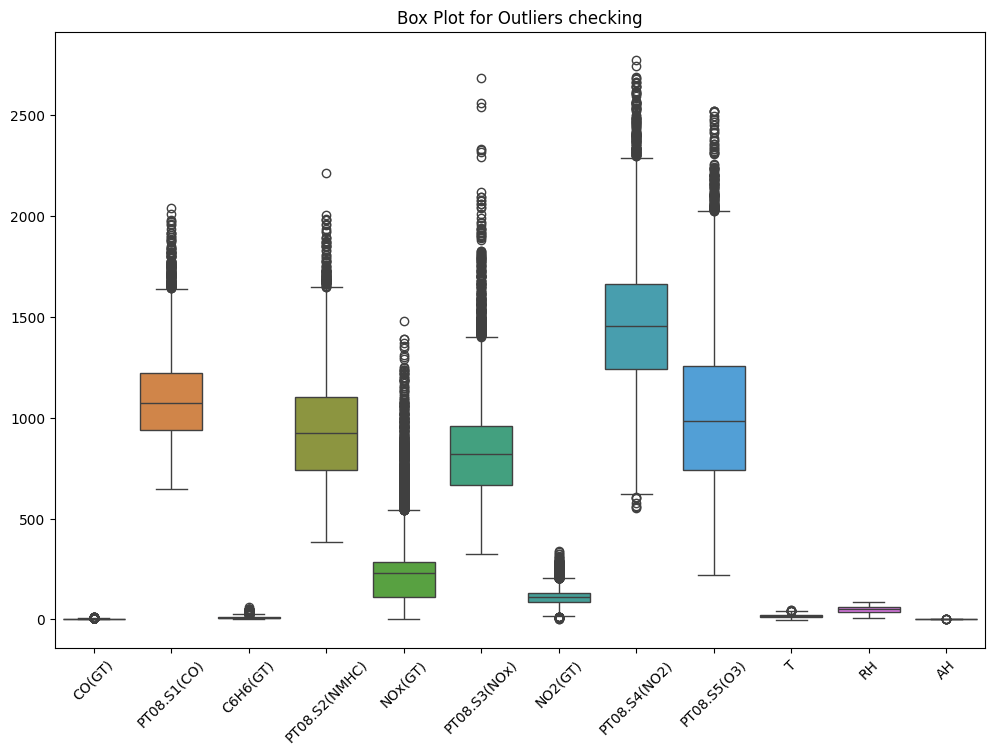

In [ ]:
# Plot box plots for summary statistics of numerical columns
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.title('Box Plot for Outliers checking')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Convert 'Date' and 'Time' columns to a single DateTime column
df['DateTime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], format='%d/%m/%Y %H.%M.%S')
data = df.drop(columns=['Date', 'Time'])  # Drop original Date and Time columns

KeyError: 'Date'

In [ ]:
data.head()

NameError: name 'data' is not defined

In [ ]:
data.tail()

NameError: name 'data' is not defined

In [ ]:
# Plot histograms for each numeric column
data.hist(bins=20, figsize=(14, 10))
plt.suptitle("Distribution of Numeric Columns")
plt.show()


NameError: name 'data' is not defined

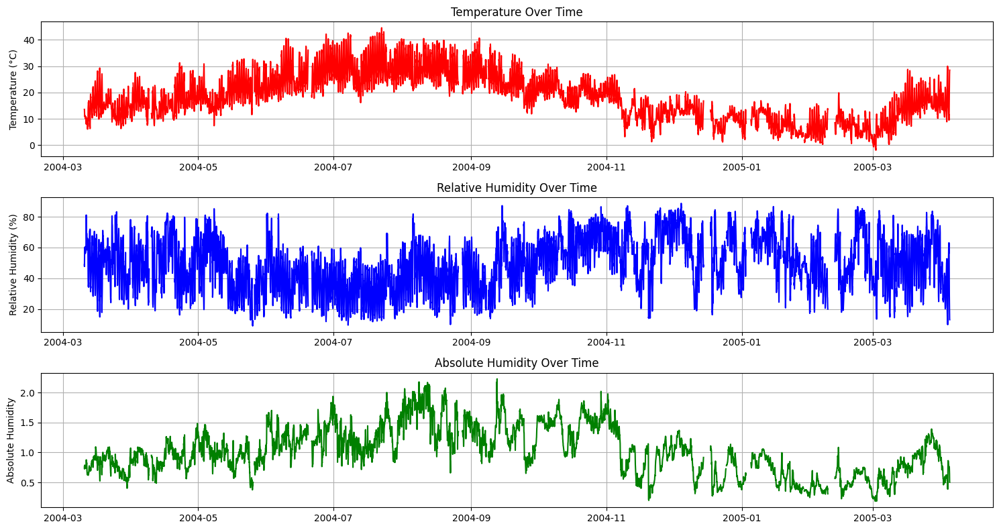

In [ ]:
# Plot time series for temperature, humidity, and air quality metrics
plt.figure(figsize=(15, 8))

# Temperature
plt.subplot(3, 1, 1)
plt.plot(data['DateTime'], data['T'], label='Temperature (T)', color='red')
plt.ylabel('Temperature (°C)')
plt.title('Temperature Over Time')
plt.grid()

# Relative Humidity
plt.subplot(3, 1, 2)
plt.plot(data['DateTime'], data['RH'], label='Relative Humidity (RH)', color='blue')
plt.ylabel('Relative Humidity (%)')
plt.title('Relative Humidity Over Time')
plt.grid()

# Absolute Humidity
plt.subplot(3, 1, 3)
plt.plot(data['DateTime'], data['AH'], label='Absolute Humidity (AH)', color='green')
plt.ylabel('Absolute Humidity')
plt.title('Absolute Humidity Over Time')
plt.grid()

plt.tight_layout()
plt.show()


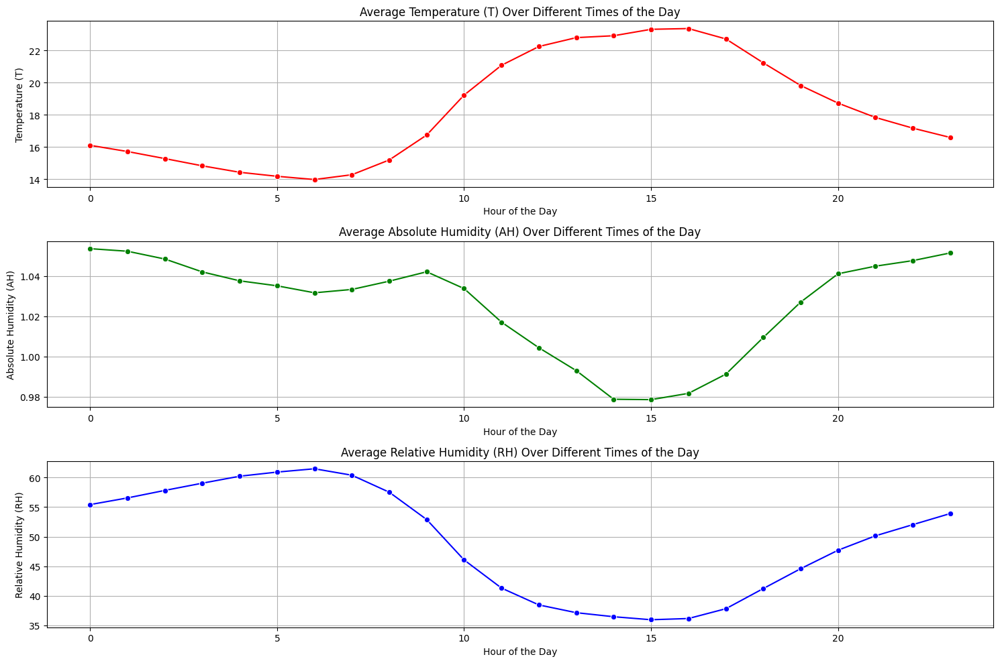

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract hour from the DateTime column
data['Hour'] = data['DateTime'].dt.hour

# Group the data by Hour and calculate the mean for each hour (for visualization purposes)
hourly_data = data.groupby('Hour')[['T', 'AH', 'RH']].mean()

# Plot how T, AH, and RH change over the hours of the day
plt.figure(figsize=(15, 10))

# Temperature (T)
plt.subplot(3, 1, 1)
sns.lineplot(x=hourly_data.index, y=hourly_data['T'], marker='o', color='red')
plt.xlabel('Hour of the Day')
plt.ylabel('Temperature (T)')
plt.title('Average Temperature (T) Over Different Times of the Day')
plt.grid(True)

# Absolute Humidity (AH)
plt.subplot(3, 1, 2)
sns.lineplot(x=hourly_data.index, y=hourly_data['AH'], marker='o', color='green')
plt.xlabel('Hour of the Day')
plt.ylabel('Absolute Humidity (AH)')
plt.title('Average Absolute Humidity (AH) Over Different Times of the Day')
plt.grid(True)

# Relative Humidity (RH)
plt.subplot(3, 1, 3)
sns.lineplot(x=hourly_data.index, y=hourly_data['RH'], marker='o', color='blue')
plt.xlabel('Hour of the Day')
plt.ylabel('Relative Humidity (RH)')
plt.title('Average Relative Humidity (RH) Over Different Times of the Day')
plt.grid(True)

plt.tight_layout()
plt.show()


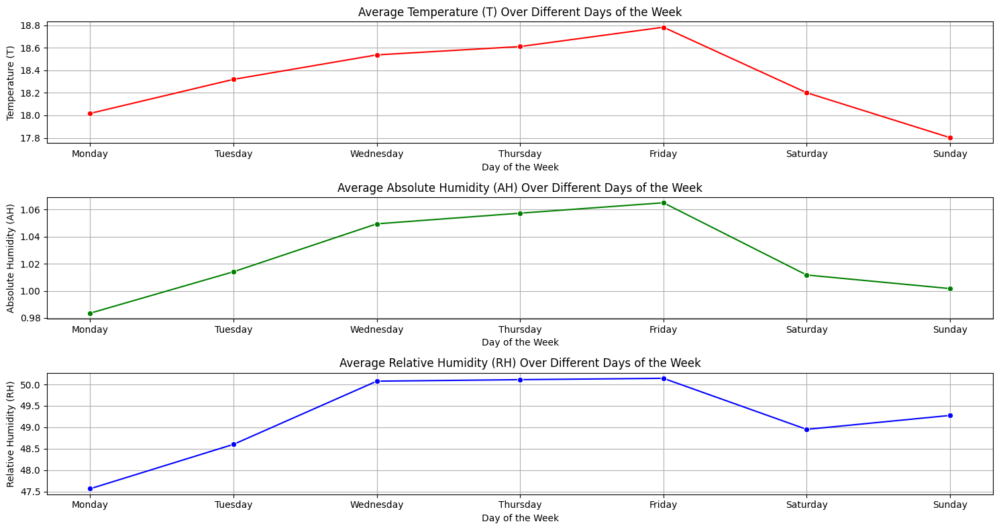

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the day of the week from the DateTime column (0 = Monday, 6 = Sunday)
data['DayOfWeek'] = data['DateTime'].dt.dayofweek

# Group the data by Day of Week and calculate the mean for each day (for visualization purposes)
weekly_data = data.groupby('DayOfWeek')[['T', 'AH', 'RH']].mean()

# Map day numbers to day names for better readability
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekly_data['DayName'] = weekly_data.index.map(lambda x: day_names[x])

# Plot how T, AH, and RH change over the days of the week
plt.figure(figsize=(15, 8))

# Temperature (T)
plt.subplot(3, 1, 1)
sns.lineplot(x=weekly_data['DayName'], y=weekly_data['T'], marker='o', color='red')
plt.xlabel('Day of the Week')
plt.ylabel('Temperature (T)')
plt.title('Average Temperature (T) Over Different Days of the Week')
plt.grid(True)

# Absolute Humidity (AH)
plt.subplot(3, 1, 2)
sns.lineplot(x=weekly_data['DayName'], y=weekly_data['AH'], marker='o', color='green')
plt.xlabel('Day of the Week')
plt.ylabel('Absolute Humidity (AH)')
plt.title('Average Absolute Humidity (AH) Over Different Days of the Week')
plt.grid(True)

# Relative Humidity (RH)
plt.subplot(3, 1, 3)
sns.lineplot(x=weekly_data['DayName'], y=weekly_data['RH'], marker='o', color='blue')
plt.xlabel('Day of the Week')
plt.ylabel('Relative Humidity (RH)')
plt.title('Average Relative Humidity (RH) Over Different Days of the Week')
plt.grid(True)

plt.tight_layout()
plt.show()


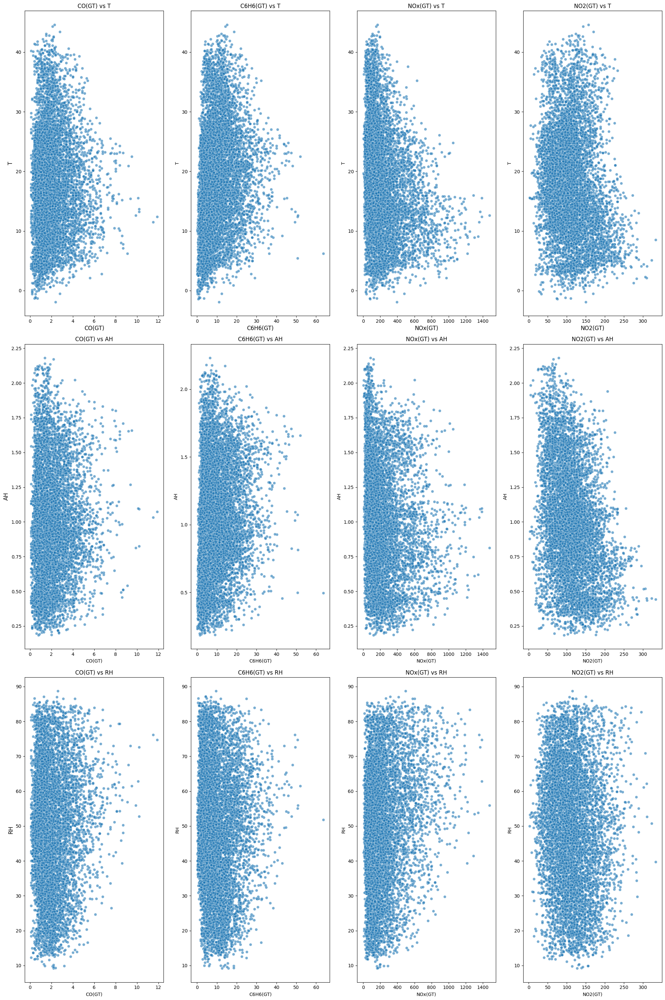

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define input features and target variables
input_features = ['CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)']
target_variables = ['T', 'AH', 'RH']

# Set up the figure size
plt.figure(figsize=(20, 30))

# Generate scatter plots for each feature vs each target
plot_number = 1
for target in target_variables:
    for feature in input_features:
        plt.subplot(len(target_variables), len(input_features), plot_number)
        sns.scatterplot(x=data[feature], y=data[target], alpha=0.6)
        plt.xlabel(feature)
        plt.ylabel(target)
        plt.title(f"{feature} vs {target}")
        plot_number += 1


plt.subplots_adjust(top=0.95)  # Adjust the space for the suptitle

# Add row and column labels
for i, target in enumerate(target_variables):
    plt.subplot(len(target_variables), len(input_features), i * len(input_features) + 1)
    plt.ylabel(target, fontsize=12)

for j, feature in enumerate(input_features):
    plt.subplot(len(target_variables), len(input_features), j + 1)
    plt.xlabel(feature, fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
# finally calculating the interquartile range IQR
IQR = Q3 - Q1

In [ ]:
# if the values fall behind Q1 - (1.5 * IQR) or above Q3 + 1.5*IQR,
#then it is been defined as outlier
((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).sum()

,0
CO(GT),454
PT08.S1(CO),145
C6H6(GT),286
PT08.S2(NMHC),91
NOx(GT),778
PT08.S3(NOx),278
NO2(GT),380
PT08.S4(NO2),131
PT08.S5(O3),131
T,10


In [ ]:
mask = (df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))
mask

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
9352,False,False,False,False,False,False,False,False,False,False,False,False
9353,False,False,False,False,False,False,False,False,False,False,False,False
9354,False,False,False,False,False,False,False,False,False,False,False,False
9355,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
# now replacing all the outliers using the median of that particular column
for i in mask.columns:
    df[i].astype('float')
    temp = df[i].median()
    df.loc[mask[i], i] = temp

In [ ]:
# outliers are now being handled and are replaced with that column's median value
((df[col] < (Q1 - 1.5 * IQR)) | (df[col] > (Q3 + 1.5 * IQR))).sum()

,0
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0
PT08.S5(O3),0
T,0


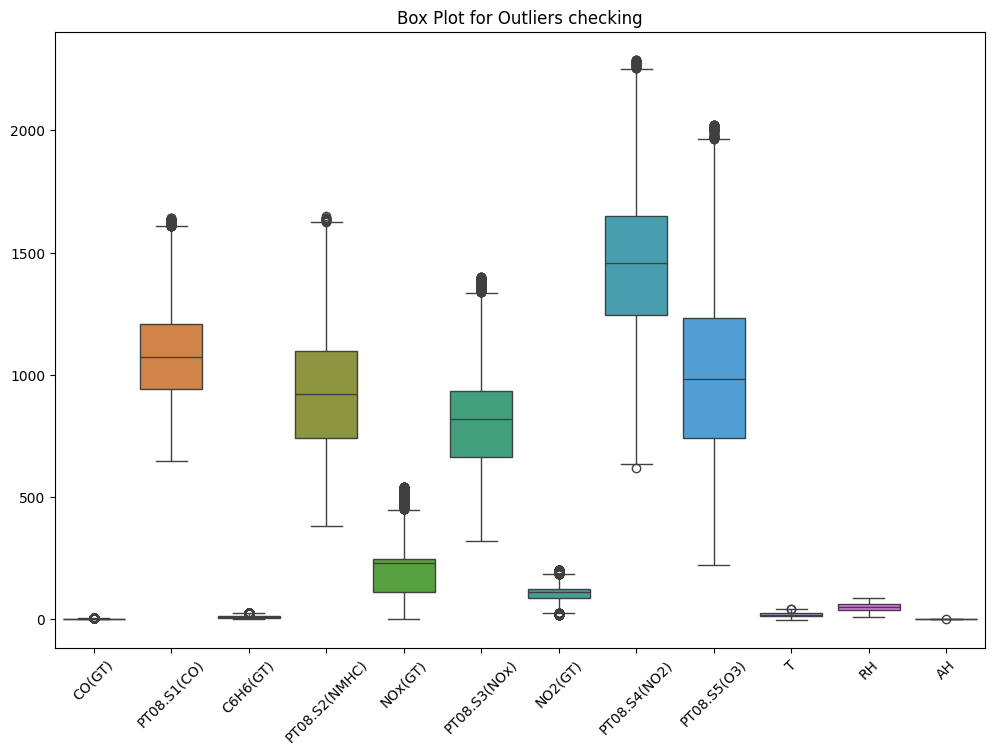

In [ ]:
# Plot box plots for summary statistics of numerical columns
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.title('Box Plot for Outliers checking')
plt.xticks(rotation=45)
plt.show()

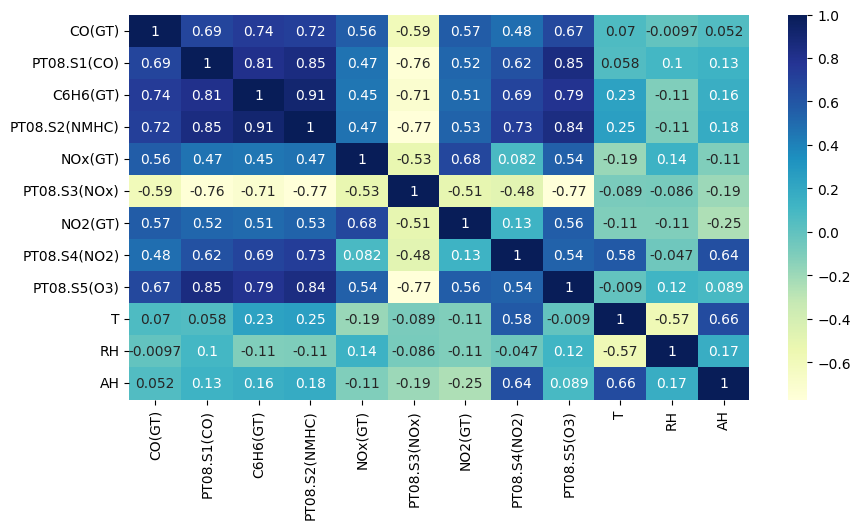

In [ ]:
plt.figure(figsize=(10,5))
sns.heatmap(df.corr(),cmap='YlGnBu',annot=True)
plt.show()

In [ ]:
df.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,1.968721,1089.326487,9.334917,930.984839,204.274420,811.638416,108.748371,1443.756066,1006.158667,18.291261,49.234201,1.024670
std,0.966963,196.073991,5.973808,248.276069,112.523540,207.612210,36.417725,318.094987,365.169196,8.619390,16.974801,0.394603
min,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,16.000000,621.000000,221.000000,-1.900000,9.200000,0.184700
25%,1.200000,941.000000,4.600000,743.000000,112.000000,666.000000,86.000000,1243.000000,742.000000,12.000000,36.600000,0.746100
50%,2.152750,1075.000000,8.600000,923.000000,229.000000,818.000000,113.091251,1456.264598,983.000000,18.300000,49.234201,1.015400
75%,2.300000,1208.000000,12.700000,1096.000000,246.896735,934.000000,126.000000,1648.000000,1231.000000,24.000000,61.900000,1.295000
max,4.700000,1640.000000,27.100000,1648.000000,542.000000,1401.000000,203.000000,2289.000000,2023.000000,42.200000,88.700000,2.119500


In [ ]:
num_columns_selected1=['CO(GT)','PT08.S1(CO)', 'C6H6(GT)','PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)','PT08.S5(O3)']

In [ ]:
df.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [ ]:
X=df[num_columns_selected1].to_numpy()
Y = df[['T', 'RH', 'AH']].to_numpy()

In [ ]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
X_scaled=scale.fit_transform(X)

In [ ]:
# Train-Test Split for multi-output regression
X_train, X_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.2, random_state=0)

In [ ]:
X_train

array([[ 0.19032588, -0.3892947 , -0.65873011, ...,  0.11925818,
         0.07936398, -0.30715806],
       [ 0.19032588,  1.77837022,  1.26644306, ...,  0.11925818,
        -0.12184454,  2.6176699 ],
       [-1.41556088, -0.93503623, -0.87635838, ...,  0.11925818,
         0.36860122, -1.07944409],
       ...,
       [-1.62240515, -1.63378939, -1.22791174, ..., -1.75057003,
        -0.97383685, -0.97537718],
       [-0.69160592, -0.28218655, -0.55828629, ..., -0.73452696,
         0.37488899, -0.94799115],
       [-0.27791737,  0.04933867,  0.27874552, ...,  0.22659487,
         0.90620522, -0.45778122]])

In [ ]:
# Function to evaluate model performance
def evaluate_model(model, X_test, y_test, model_name="Model"):
    predictions = model.predict(X_test)
    r2_scores = []
    mse_scores = []

    for i in range(y_test.shape[1]):
        r2 = r2_score(y_test[:, i], predictions[:, i])
        mse = mean_squared_error(y_test[:, i], predictions[:, i])
        r2_scores.append(r2)
        mse_scores.append(mse)
        print(f"{model_name} R² for target {i+1}: {r2}")
        print(f"{model_name} MSE for target {i+1}: {mse}")

    overall_r2 = r2_score(y_test, predictions)
    print(f"{model_name} Overall R²: {overall_r2}\n")

In [ ]:

linear_regression_model = LinearRegression()
linear_regression_model.fit(X_train, y_train)

LinearRegression()

In [ ]:
print("Linear Regression:")
evaluate_model(linear_regression_model, X_test, y_test, "Linear Regression")

Linear Regression:
Linear Regression R² for target 1: 0.5537941256001038
Linear Regression MSE for target 1: 34.547629508728576
Linear Regression R² for target 2: 0.3183391373917688
Linear Regression MSE for target 2: 203.36485038719485
Linear Regression R² for target 3: 0.6809698068664529
Linear Regression MSE for target 3: 0.052669289211749216
Linear Regression Overall R²: 0.5177010232861087



In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
# Random Forest Regressor
rf_model = RandomForestRegressor(random_state=0)
rf_model.fit(X_train, y_train)
print("Random Forest Regressor:")
evaluate_model(rf_model, X_test, y_test, "Random Forest Regressor")

Random Forest Regressor:
Random Forest Regressor R² for target 1: 0.8145667627604036
Random Forest Regressor MSE for target 1: 14.357226442555405
Random Forest Regressor R² for target 2: 0.7068229318742416
Random Forest Regressor MSE for target 2: 87.46565024757425
Random Forest Regressor R² for target 3: 0.8803707809560757
Random Forest Regressor MSE for target 3: 0.019749810743971235
Random Forest Regressor Overall R²: 0.8005868251969067



In [ ]:
# Support Vector Regression
svr_models = [SVR() for _ in range(3)]
predictions = np.zeros(y_test.shape)
for i in range(3):
    svr_models[i].fit(X_train, y_train[:, i])
    predictions[:, i] = svr_models[i].predict(X_test)

In [ ]:
print("Support Vector Regression:")
for i in range(3):
    r2 = r2_score(y_test[:, i], predictions[:, i])
    mse = mean_squared_error(y_test[:, i], predictions[:, i])
    print(f"SVR R² for target {i+1}: {r2}")
    print(f"SVR MSE for target {i+1}: {mse}")
overall_r2_svr = r2_score(y_test, predictions)
print(f"SVR Overall R²: {overall_r2_svr}\n")

Support Vector Regression:
SVR R² for target 1: 0.7195004821419271
SVR MSE for target 1: 21.71776297963493
SVR R² for target 2: 0.5325055280633583
SVR MSE for target 2: 139.47103106149166
SVR R² for target 3: 0.8878418572010323
SVR MSE for target 3: 0.01851639684165783
SVR Overall R²: 0.7132826224687729



In [ ]:
# Polynomial Regression
poly_features = PolynomialFeatures(degree=2)
X_poly_train = poly_features.fit_transform(X_train)
X_poly_test = poly_features.transform(X_test)
poly_model = LinearRegression()
poly_model.fit(X_poly_train, y_train)
print("Polynomial Regression:")
evaluate_model(poly_model, X_poly_test, y_test, "Polynomial Regression")

Polynomial Regression:
Polynomial Regression R² for target 1: 0.6788789082218013
Polynomial Regression MSE for target 1: 24.862901056853982
Polynomial Regression R² for target 2: 0.520967245192321
Polynomial Regression MSE for target 2: 142.9133310357271
Polynomial Regression R² for target 3: 0.7665064616912285
Polynomial Regression MSE for target 3: 0.03854788343845365
Polynomial Regression Overall R²: 0.6554508717017834



In [ ]:
# K-Nearest Neighbors Regression
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train, y_train)
print("K-Nearest Neighbors Regression:")
evaluate_model(knn_model, X_test, y_test, "K-Nearest Neighbors Regression")

K-Nearest Neighbors Regression:
K-Nearest Neighbors Regression R² for target 1: 0.8140814766259974
K-Nearest Neighbors Regression MSE for target 1: 14.39479987342907
K-Nearest Neighbors Regression R² for target 2: 0.6537056343739092
K-Nearest Neighbors Regression MSE for target 2: 103.31252051939082
K-Nearest Neighbors Regression R² for target 3: 0.8780623055782748
K-Nearest Neighbors Regression MSE for target 3: 0.020130921246765254
K-Nearest Neighbors Regression Overall R²: 0.7819498055260604



In [ ]:
# Decision Tree Regressor
dt_model = DecisionTreeRegressor(random_state=0)
dt_model.fit(X_train, y_train)
print("Decision Tree Regressor:")
evaluate_model(dt_model, X_test, y_test, "Decision Tree Regressor")

Decision Tree Regressor:
Decision Tree Regressor R² for target 1: 0.6025242441662138
Decision Tree Regressor MSE for target 1: 30.77468482394032
Decision Tree Regressor R² for target 2: 0.39489986963872525
Decision Tree Regressor MSE for target 2: 180.5239294644915
Decision Tree Regressor R² for target 3: 0.7033880345411533
Decision Tree Regressor MSE for target 3: 0.04896822222051505
Decision Tree Regressor Overall R²: 0.5669373827820307



In [ ]:
# Gradient Boosting Regressor
# Wrap GradientBoostingRegressor with MultiOutputRegressor
gb_model = MultiOutputRegressor(GradientBoostingRegressor(random_state=0))
gb_model.fit(X_train, y_train)
print("Gradient Boosting Regressor:")
evaluate_model(gb_model, X_test, y_test, "Gradient Boosting Regressor")

Gradient Boosting Regressor:
Gradient Boosting Regressor R² for target 1: 0.7262492769199524
Gradient Boosting Regressor MSE for target 1: 21.195235431257768
Gradient Boosting Regressor R² for target 2: 0.5608136705848435
Gradient Boosting Regressor MSE for target 2: 131.02565670540238
Gradient Boosting Regressor R² for target 3: 0.8351615428344054
Gradient Boosting Regressor MSE for target 3: 0.027213488129128136
Gradient Boosting Regressor Overall R²: 0.7074081634464003



In [ ]:
# XGBoost Regressor
xgb_model = XGBRegressor(random_state=0)
xgb_model.fit(X_train, y_train)
print("XGBoost Regressor:")
evaluate_model(xgb_model, X_test, y_test, "XGBoost Regressor")


XGBoost Regressor:
XGBoost Regressor R² for target 1: 0.8034429385700187
XGBoost Regressor MSE for target 1: 15.218492012773412
XGBoost Regressor R² for target 2: 0.6811587708310591
XGBoost Regressor MSE for target 2: 95.12222635037342
XGBoost Regressor R² for target 3: 0.9132958152816388
XGBoost Regressor MSE for target 3: 0.014314155459538824
XGBoost Regressor Overall R²: 0.7992991748942391



In [ ]:
# AdaBoost Regressor
ada_model = MultiOutputRegressor(AdaBoostRegressor(random_state=0))
ada_model.fit(X_train, y_train)
print("AdaBoost Regressor:")
evaluate_model(ada_model, X_test, y_test, "AdaBoost Regressor")


AdaBoost Regressor:
AdaBoost Regressor R² for target 1: 0.543766782454613
AdaBoost Regressor MSE for target 1: 35.32399969079579
AdaBoost Regressor R² for target 2: 0.28834627034962235
AdaBoost Regressor MSE for target 2: 212.3128408811345
AdaBoost Regressor R² for target 3: 0.6058495779905244
AdaBoost Regressor MSE for target 3: 0.06507102781039922
AdaBoost Regressor Overall R²: 0.4793208769315866



In [ ]:
# Ridge Regression
ridge_model = Ridge()
ridge_model.fit(X_train, y_train)
print("Ridge Regression:")
evaluate_model(ridge_model, X_test, y_test, "Ridge Regression")


Ridge Regression:
Ridge Regression R² for target 1: 0.5537752678251451
Ridge Regression MSE for target 1: 34.54908957785812
Ridge Regression R² for target 2: 0.3183277230366448
Ridge Regression MSE for target 2: 203.36825571490164
Ridge Regression R² for target 3: 0.6809400820420386
Ridge Regression MSE for target 3: 0.05267419653841465
Ridge Regression Overall R²: 0.5176810243012762



In [ ]:
bayesian_ridge_model = MultiOutputRegressor(BayesianRidge())
bayesian_ridge_model.fit(X_train, y_train)
print("Bayesian Ridge Regression:")
evaluate_model(bayesian_ridge_model, X_test, y_test, "Bayesian Ridge Regression")


Bayesian Ridge Regression:
Bayesian Ridge Regression R² for target 1: 0.5537196387938089
Bayesian Ridge Regression MSE for target 1: 34.55339667302381
Bayesian Ridge Regression R² for target 2: 0.31828996475252525
Bayesian Ridge Regression MSE for target 2: 203.37952041883588
Bayesian Ridge Regression R² for target 3: 0.6809196829624338
Bayesian Ridge Regression MSE for target 3: 0.05267756426048765
Bayesian Ridge Regression Overall R²: 0.5176430955029226



In [ ]:
pip install shap

In [ ]:
import shap

100%|===================| 5615/5616 [09:10<00:00]       

TypeError: only integer scalar arrays can be converted to a scalar index

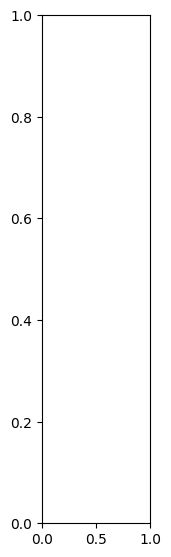

In [ ]:
# SHAP Explainer for Random Forest (disable additivity check)
explainer_rf = shap.Explainer(rf_model, X_train)
shap_values_rf = explainer_rf(X_test, check_additivity=False)

# Plot SHAP summary for Random Forest
#shap.summary_plot(shap_values_rf, X_test, feature_names=num_columns_selected1)


SHAP Summary for T


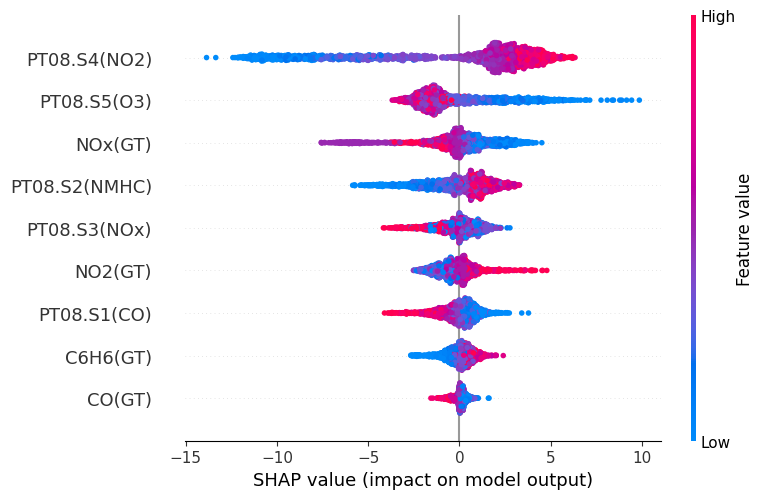

SHAP Summary for RH


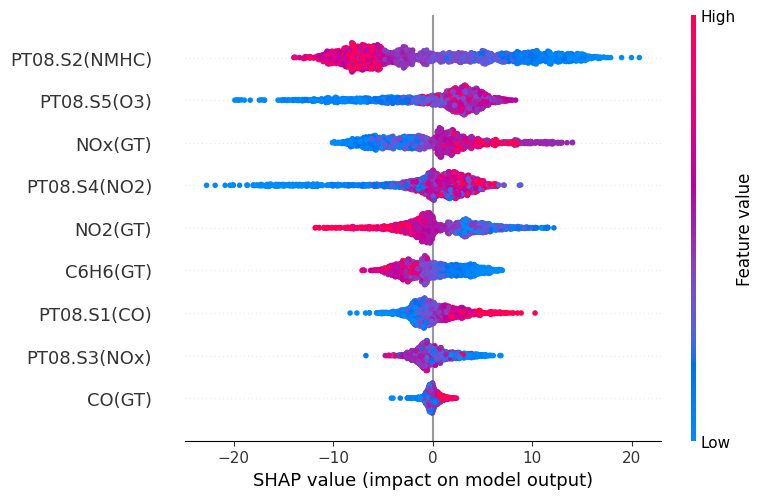

SHAP Summary for AH


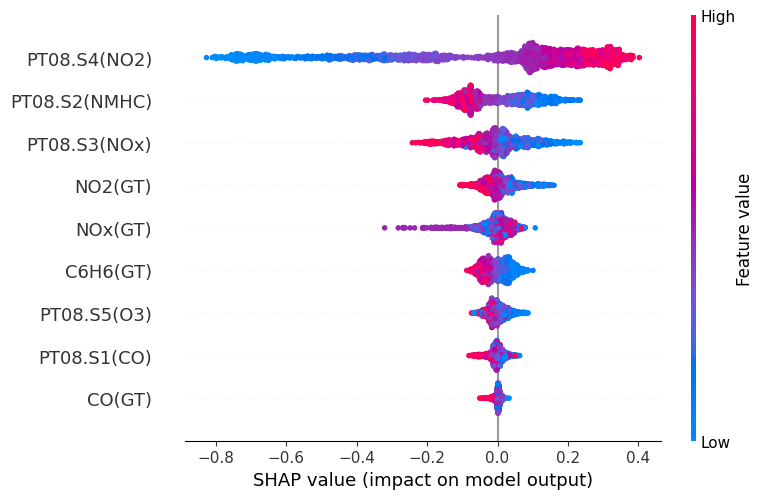

In [ ]:
# Generate SHAP plots for each target variable
targets = ['T', 'RH', 'AH']
for i in range(len(targets)):
    print(f"SHAP Summary for {targets[i]}")
    shap.summary_plot(shap_values_rf[:, :, i], X_test, feature_names=num_columns_selected1)

In [ ]:
explainer_rf2 = shap.TreeExplainer(rf_model)
shap_values_rf2 = explainer_rf2.shap_values(X_test)

SHAP Summary for T


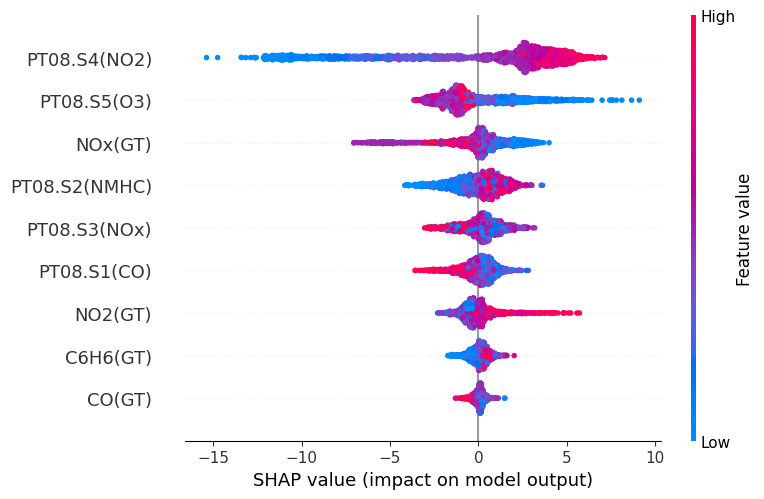

SHAP Summary for RH


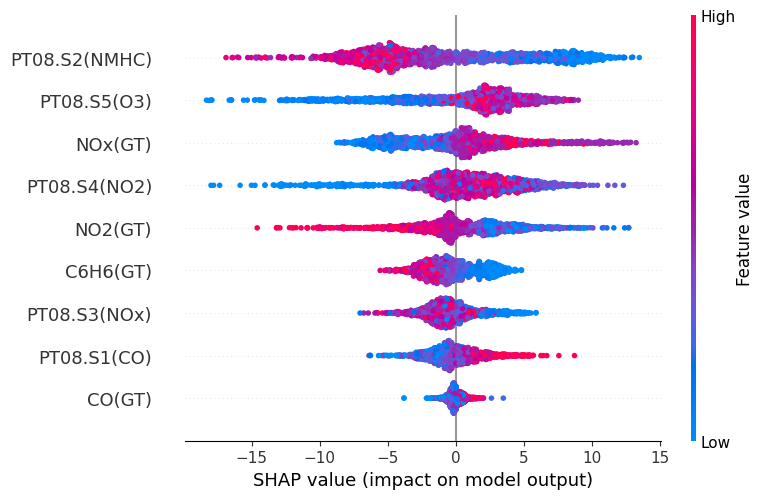

SHAP Summary for AH


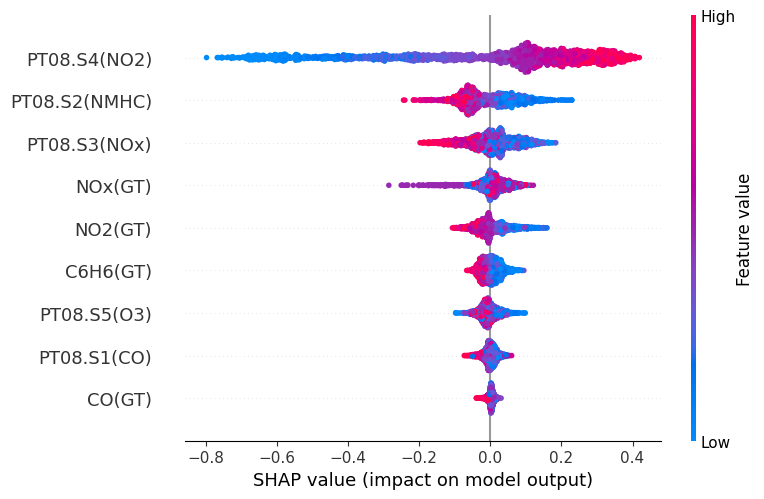

In [ ]:
# Generate SHAP plots for each target variable
targets = ['T', 'RH', 'AH']
for i in range(len(targets)):
    print(f"SHAP Summary for {targets[i]}")
    shap.summary_plot(shap_values_rf2[:, :, i], X_test, feature_names=num_columns_selected1)

SHAP Waterfall Plot for T (Sample 0)


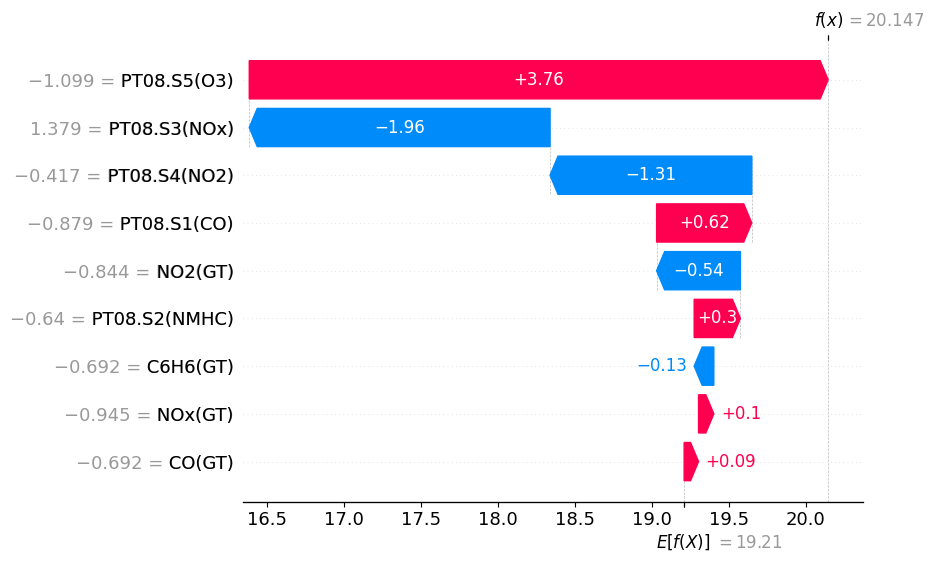

SHAP Waterfall Plot for RH (Sample 0)


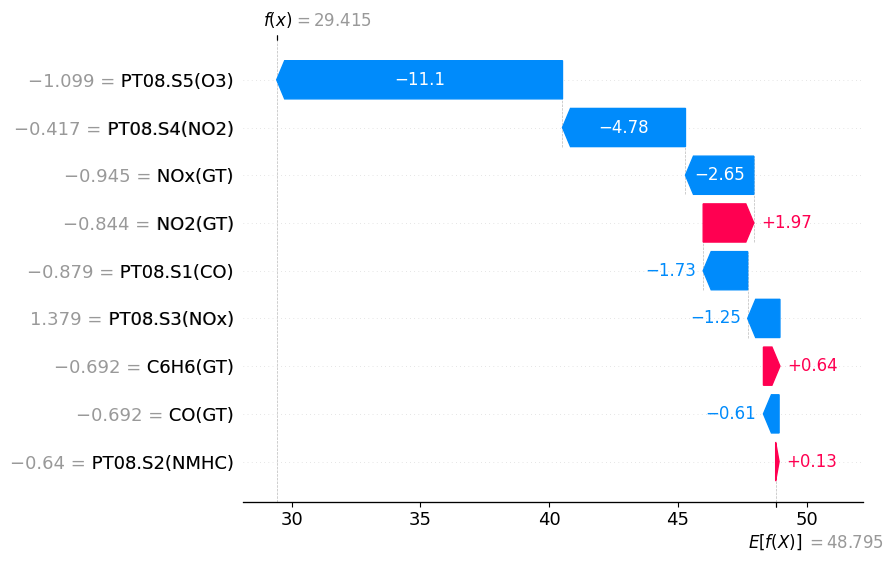

SHAP Waterfall Plot for AH (Sample 0)


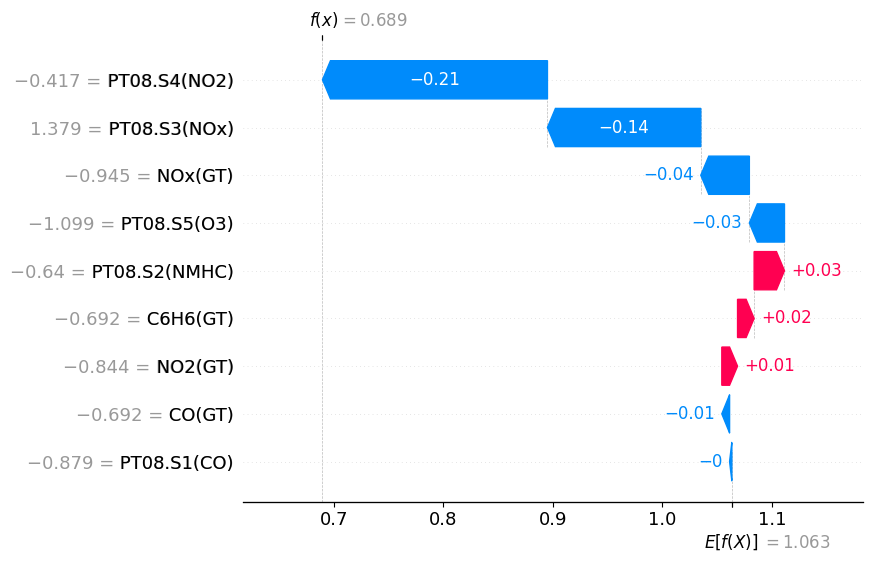

In [ ]:
# Select a sample index
sample_idx = 0  # Change this to visualize different samples

# Generate SHAP values for the selected sample
shap_values_sample = shap_values_rf[sample_idx]

# Plot waterfall for each target variable
targets = ['T', 'RH', 'AH']
for i in range(len(targets)):
    print(f"SHAP Waterfall Plot for {targets[i]} (Sample {sample_idx})")
    shap.waterfall_plot(shap.Explanation(values=shap_values_sample[:, i],
                                         base_values=explainer_rf.expected_value[i],
                                         data=X_test[sample_idx],
                                         feature_names=num_columns_selected1))


In [ ]:
pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=2d922bc3ae4d1f2e7ac16a6e2b85009adba6ab48b1d89e6b6a3fe844d9c209e6
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


In [ ]:
import lime
import lime.lime_tabular
import numpy as np


In [ ]:
# Initialize LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=num_columns_selected1,
    class_names=['T', 'RH', 'AH'],  # Target names
    mode="regression"
)


In [ ]:
# Select the same sample as before
sample_idx = 0
sample_instance = X_test[sample_idx].reshape(1, -1)

# Generate LIME explanation for each target variable
targets = ['T', 'RH', 'AH']
for i in range(len(targets)):
    print(f"LIME Explanation for {targets[i]} (Sample {sample_idx})")

    # Explain model prediction for the given target (i)
    exp = explainer.explain_instance(
        data_row=sample_instance.flatten(),
        predict_fn=lambda x: rf_model.predict(x)[:, i]  # Extract predictions for target i
    )

    # Plot the explanation
    exp.show_in_notebook(show_table=True, show_all=False)


LIME Explanation for T (Sample 0)


LIME Explanation for RH (Sample 0)


LIME Explanation for AH (Sample 0)


In [ ]:
pip install dalex


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 10.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.7.1-py3-none-any.whl size=1042797 sha256=6f918694210377219108805b03a164dd0782d6efba952c9e387bb02f7f2cdd8e
  Stored in directory: /root/.cache/pip/wheels/50/24/3e/5a88876cfa3bd019ba82ec57c228eae1a37f479c0f8353e5cb
Successfully built dalex


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import dalex as dx

# Assuming X_train_imputed and X_test_imputed are already imputed DataFrames
# and feature_names is a list of feature names

# Convert X_train_imputed and X_test_imputed to DataFrames with feature names
X_train = pd.DataFrame(X_train, columns=num_columns_selected1)
X_test = pd.DataFrame(X_test, columns=num_columns_selected1)

# Initialize and train the Random Forest model for each target variable (T, RH, AH)
target_names = ["T", "RH", "AH"]
rf_models = {}

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)  # y_train[target_name] is the target column

# Make predictions for this target
y_pred = rf_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)  # Calculate Mean Squared Error
print(f"Model for {target_names[i]} trained. MSE: {mse}")
r2 = r2_score(y_test, y_pred)
print(f"Model for {target_names[i]} trained. R2: {r2}")

Model for AH trained. MSE: 34.09898221712933
Model for AH trained. R2: 0.8000166484873664


In [ ]:
import dalex as dx

# Iterate over each target variable and create an explainer
for i, target_name in enumerate(["T", "RH", "AH"]):
    print(f"\nVariable Importance for Target: {target_name}")

    # Extract the current target (1D array)
    y_target = y_test[:, i]

    # Ensure y_target is a 1D array
    y_target = y_target.flatten()

    # Create an explainer for the current target variable
    # Update predict_function to accept two arguments (model, data)
    # but only use the data (X) for prediction
    explainer_rf = dx.Explainer(rf_model, X_test, y_target, label=f"RF - {target_name}",
                               predict_function=lambda model, X: rf_model.predict(X)[:, i])

    # Compute feature importance
    importance_rf = explainer_rf.model_parts()

    # Plot Variable Importance
    importance_rf.plot()


Variable Importance for Target: T
Preparation of a new explainer is initiated

  -> data              : 1872 rows 9 cols
  -> target variable   : 1872 values
  -> model_class       : sklearn.ensemble._forest.RandomForestRegressor (default)
  -> label             : RF - T
  -> predict function  : <function <lambda> at 0x7d4654533560> will be used
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 2.55, mean = 18.3, max = 37.2
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -18.0, mean = 0.126, max = 16.8
  -> model_info        : package sklearn

A new explainer has been created!



Variable Importance for Target: RH
Preparation of a new explainer is initiated

  -> data              : 1872 rows 9 cols
  -> target variable   : 1872 values
  -> model_class       : sklearn.ensemble._forest.RandomForestRegressor (default)
  -> label             : RF - RH
  -> predict function  : <function <lambda> at 0x7d464ffe3600> will be used
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 16.3, mean = 49.2, max = 76.7
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -32.7, mean = -0.283, max = 29.7
  -> model_info        : package sklearn

A new explainer has been created!



Variable Importance for Target: AH
Preparation of a new explainer is initiated

  -> data              : 1872 rows 9 cols
  -> target variable   : 1872 values
  -> model_class       : sklearn.ensemble._forest.RandomForestRegressor (default)
  -> label             : RF - AH
  -> predict function  : <function <lambda> at 0x7d4654531760> will be used
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.246, mean = 1.02, max = 1.91
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.72, mean = -0.000723, max = 0.566
  -> model_info        : package sklearn

A new explainer has been created!


In [ ]:
import dalex as dx

# Define target names
target_names = ["T", "RH", "AH"]

# Iterate over each target variable
for i, target_name in enumerate(target_names):
    print(f"\nGenerating Breakdown plot for Target: {target_name}")

    # Extract the current target (1D array)
    y_target = y_test[:, i]

    # Select a specific sample (e.g., the first sample in the test set)
    sample_idx = 0  # Change to the index of the sample you want to analyze
    sample_data = X_test.iloc[sample_idx].values  # Get the feature values for this sample (NumPy indexing)
    #print(sample_data)
    explanation = explainer_rf.predict_parts(sample_data)

    # Plot the Breakdown plot for the current target
    explanation.plot(title=f"Breakdown Plot for {target_name}")  # Adding title with target name



Generating Breakdown plot for Target: T


/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/pyth


Generating Breakdown plot for Target: RH


/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/pyth


Generating Breakdown plot for Target: AH


/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/python3.11/dist-packages/dalex/predict_explanations/_break_down/utils.py:124: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/usr/local/lib/pyth

In [ ]:
# Initialize SHAP explainer for KNN
explainer_knn = shap.Explainer(knn_model.predict, X_train)  # KNN needs a different approach
shap_values_knn = explainer_knn(X_test)

ExactExplainer explainer: 1873it [1:39:18,  3.18s/it]


SHAP Summary for T


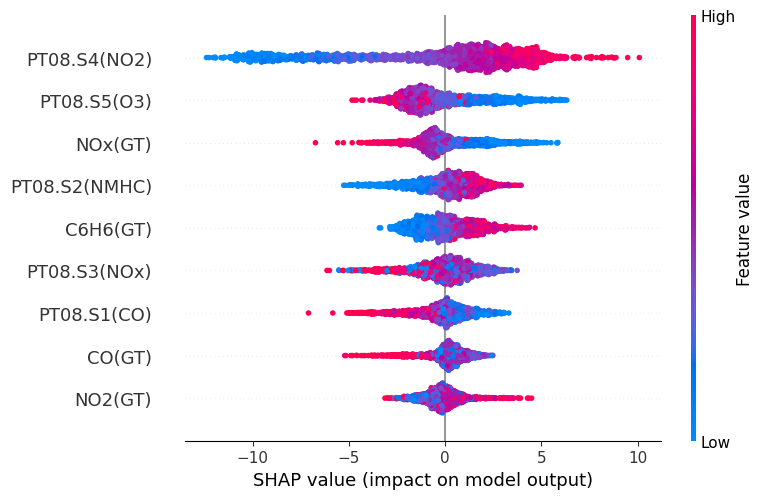

SHAP Summary for RH


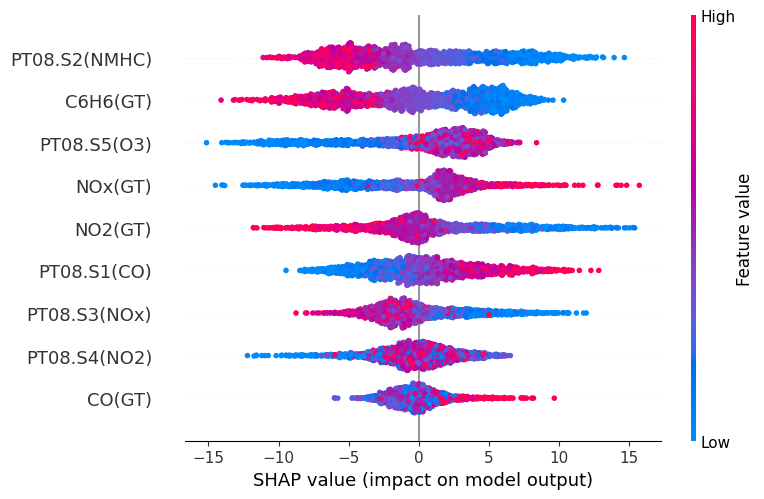

SHAP Summary for AH


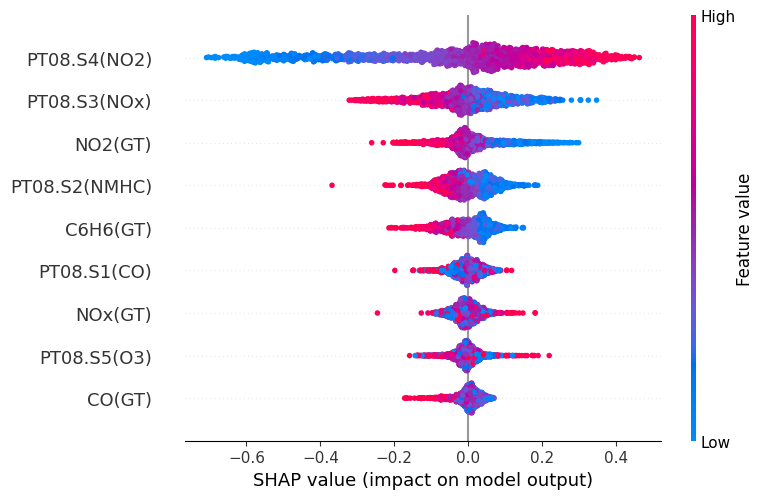

In [ ]:
# Generate SHAP plots for each target variable
targets = ['T', 'RH', 'AH']
for i in range(len(targets)):
    print(f"SHAP Summary for {targets[i]}")
    shap.summary_plot(shap_values_knn[:, :, i], X_test, feature_names=num_columns_selected1)

In [ ]:
X_test[0]

array([-0.69160592, -0.87893196, -0.69221138, -0.64038929, -0.94451436,
        1.37938365, -0.84436945, -0.41736955, -1.09861431])


Generating SHAP Waterfall Plots for Sample 0

SHAP Waterfall Plot for Target: T


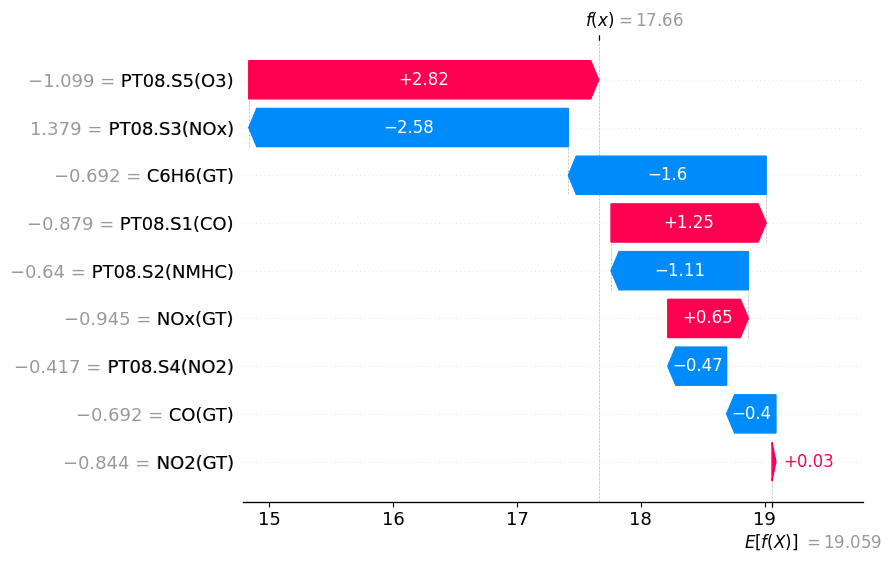


SHAP Waterfall Plot for Target: RH


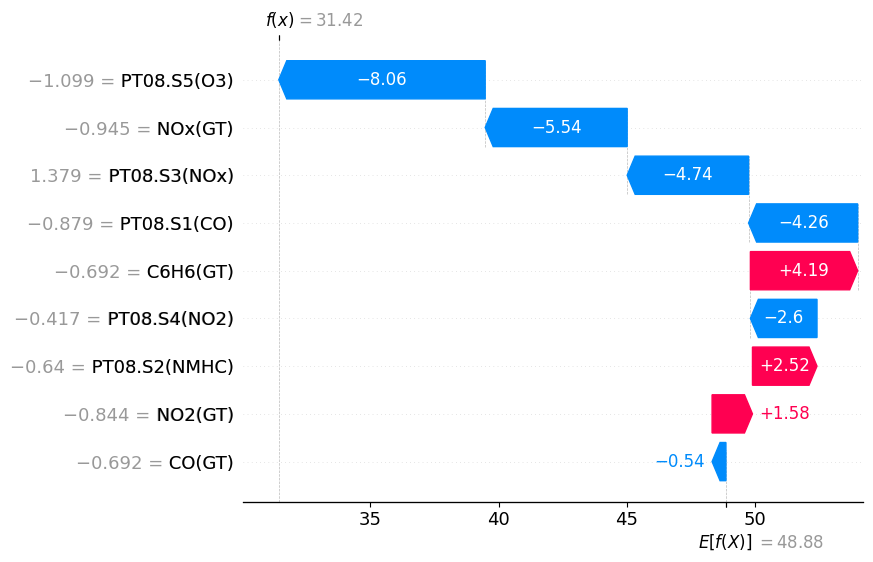


SHAP Waterfall Plot for Target: AH


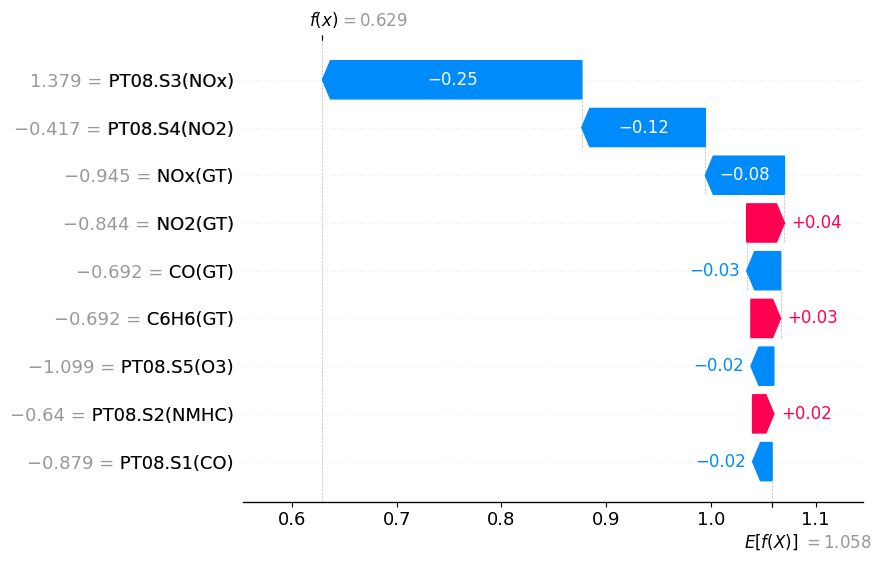

In [ ]:
import shap
import pandas as pd

# Convert X_test to DataFrame with feature names
X_test_df = pd.DataFrame(X_test, columns=num_columns_selected1)

# Select a sample instance
sample_idx = 0  # Change index if needed
sample_data = X_test_df.iloc[[sample_idx]]  # Double brackets to keep it as DataFrame

print(f"\nGenerating SHAP Waterfall Plots for Sample {sample_idx}")

# Generate SHAP values for the selected sample
shap_sample = explainer_knn(sample_data)

# Iterate over all target variables
for target_idx, target_name in enumerate(targets):
    print(f"\nSHAP Waterfall Plot for Target: {target_name}")

    # Plot SHAP waterfall for the selected target
    shap.plots.waterfall(shap_sample[0, :, target_idx])  # Correct indexing for target


In [ ]:
# Initialize LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=num_columns_selected1,
    class_names=['T', 'RH', 'AH'],  # Target names
    mode="regression"
)


In [ ]:
# Select the same sample as before
sample_idx = 0
sample_instance = X_test[sample_idx].reshape(1, -1)

# Generate LIME explanation for each target variable
targets = ['T', 'RH', 'AH']
for i in range(len(targets)):
    print(f"LIME Explanation for {targets[i]} (Sample {sample_idx})")

    # Explain model prediction for the given target (i)
    exp = explainer.explain_instance(
        data_row=sample_instance.flatten(),
        predict_fn=lambda x: knn_model.predict(x)[:, i]  # Extract predictions for target i
    )

    # Plot the explanation
    exp.show_in_notebook(show_table=True, show_all=False)


LIME Explanation for T (Sample 0)


LIME Explanation for RH (Sample 0)


LIME Explanation for AH (Sample 0)


In [ ]:
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Convert X_train and X_test to DataFrames with feature names
X_train = pd.DataFrame(X_train, columns=num_columns_selected1)
X_test = pd.DataFrame(X_test, columns=num_columns_selected1)

# Initialize and train the KNN model
knn_model = KNeighborsRegressor(n_neighbors=5)  # You can tune 'n_neighbors'
knn_model.fit(X_train, y_train)

# Make predictions
y_pred_knn = knn_model.predict(X_test)

# Evaluate the model
mse_knn = mean_squared_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print(f"KNN Model trained. MSE: {mse_knn}")
print(f"KNN Model trained. R²: {r2_knn}")


KNN Model trained. MSE: 39.24248377135553
KNN Model trained. R²: 0.7819498055260604


In [ ]:
import dalex as dx

# Iterate over each target variable and create an explainer
for i, target_name in enumerate(["T", "RH", "AH"]):
    print(f"\nVariable Importance for Target: {target_name}")

    # Extract the current target (1D array)
    y_target = y_test[:, i]

    # Ensure y_target is a 1D array
    y_target = y_target.flatten()

    # Create an explainer for the current target variable
    # Update predict_function to accept two arguments (model, data)
    # but only use the data (X) for prediction
    explainer_knn = dx.Explainer(knn_model, X_test, y_target, label=f"KNN - {target_name}",
                               predict_function=lambda model, X: knn_model.predict(X)[:, i])

    # Compute feature importance
    importance_knn = explainer_knn.model_parts()

    # Plot Variable Importance
    importance_knn.plot()


Variable Importance for Target: T
Preparation of a new explainer is initiated

  -> data              : 1872 rows 9 cols
  -> target variable   : 1872 values
  -> model_class       : sklearn.neighbors._regression.KNeighborsRegressor (default)
  -> label             : KNN - T
  -> predict function  : <function <lambda> at 0x7ee555566980> will be used
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1.54, mean = 18.3, max = 39.1
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -18.6, mean = 0.0558, max = 22.3
  -> model_info        : package sklearn

A new explainer has been created!



Variable Importance for Target: RH
Preparation of a new explainer is initiated

  -> data              : 1872 rows 9 cols
  -> target variable   : 1872 values
  -> model_class       : sklearn.neighbors._regression.KNeighborsRegressor (default)
  -> label             : KNN - RH
  -> predict function  : <function <lambda> at 0x7ee54b829da0> will be used
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 14.2, mean = 48.9, max = 81.2
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -49.7, mean = 0.00702, max = 40.6
  -> model_info        : package sklearn

A new explainer has been created!



Variable Importance for Target: AH
Preparation of a new explainer is initiated

  -> data              : 1872 rows 9 cols
  -> target variable   : 1872 values
  -> model_class       : sklearn.neighbors._regression.KNeighborsRegressor (default)
  -> label             : KNN - AH
  -> predict function  : <function <lambda> at 0x7ee54bc78b80> will be used
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.239, mean = 1.02, max = 2.07
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.895, mean = 0.00113, max = 0.945
  -> model_info        : package sklearn

A new explainer has been created!
